(hsgp-advanced)=
# Gaussian Processes: HSGP Advanced Usage

:::{post} June 28, 2024
:tags: gaussian process
:category: reference, intermediate
:author: Bill Engels, Alexandre Andorra, Maxim Kochurov
:::

The Hilbert Space Gaussian processes approximation is a low-rank GP approximation that is particularly well-suited to usage in probabilistic programming languages like PyMC.  It approximates the GP using a pre-computed and fixed set of basis functions that don't depend on the form of the covariance kernel or its hyperparameters.  It's a _parametric_ approximation, so prediction in PyMC can be done as one would with a linear model via `pm.Data` or `pm.set_data`.  You don't need to define the `.conditional` distribution that non-parameteric GPs rely on.  This makes it _much_ easier to integrate an HSGP, instead of a GP, into your existing PyMC model.  Additionally, unlike many other GP approximations, HSGPs can be used anywhere within a model and with any likelihood function.  

It's also fast.  The computational cost for unapproximated GPs per MCMC step is $\mathcal{O}(n^3)$, where $n$ is the number of data points.  For HSGPs, it is $\mathcal{O}(mn + m)$, where $m$ is the number of basis vectors.  It's important to note that _sampling speeds_ are also very strongly determined by posterior geometry. 

The HSGP approximation does carry some restrictions:
1. It **can only be used with _stationary_ covariance kernels** such as the Matern family.  The {class}`~pymc.gp.HSGP` class is compatible with any `Covariance` class that implements the `power_spectral_density` method.  There is a special case made for the `Periodic` covariance, which is implemented in PyMC by The {class}`~pymc.gp.HSGPPeriodic`.
2. It **does not scale well with the input dimension**.  The HSGP approximation is a good choice if your GP is over a one dimensional process like a time series, or a two dimensional spatial point process.  It's likely not an efficient choice where the input dimension is larger than three. 
3. It **_may_ struggle with more rapidly varying processes**.  If the process you're trying to model changes very quickly relative to the extent of the domain, the HSGP approximation may fail to accurately represent it.  We'll show in later sections how to set the accuracy of the approximation, which involves a trade-off between the fidelity of the approximation and the computational complexity.
4. **For smaller data sets, the full unapproximated GP may still be more efficient**.

A secondary goal of this implementation is flexibility via an accessible implementation where the core computations are implemented in a modular way.  For basic usage, users can use the `.prior` and `.conditional` methods and essentially treat the HSGP class as a drop in replacement for `pm.gp.Latent`, the unapproximated GP.  More advanced users can bypass those methods and work with `.prior_linearized` instead, which exposes the HSGP as a parametric model.  For more complex models with multiple HSGPs, users can work directly with functions like `pm.gp.hsgp_approx.calc_eigenvalues` and `pm.gp.hsgp_approx.calc_eigenvectors`.

#### References:
- Original reference: [Solin & Sarkka, 2019](https://link.springer.com/article/10.1007/s11222-019-09886-w).
- HSGPs in probabilistic programming languages: [Riutort-Mayol et al., 2020](https://arxiv.org/abs/2004.11408).
- HSTPs (Student-t process): [Sellier & Dellaportas, 2023](https://proceedings.mlr.press/v202/sellier23a.html).
- Kronecker HSGPs: [Dan et al., 2022](https://arxiv.org/pdf/2210.11358.pdf)
- PyMC's {class}`~pymc.gp.HSGP` API

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import preliz as pz
import pymc as pm
import pytensor.tensor as pt

In [2]:
az.style.use("arviz-whitegrid")
plt.rcParams["figure.figsize"] = [12, 5]
%config InlineBackend.figure_format = 'retina'
seed = sum(map(ord, "hsgp advanced"))
rng = np.random.default_rng(seed)

# Example 1: A hierarchical HSGP, a more custom model

`````{admonition} Looking for a beginner's introduction?
:class: tip
This notebook is the second part of our HSGP tutorials. We strongly recommend you start by reading {ref}`the first part <hsgp>`, which is a smoother introduction to HSGPs and covers more basic use-cases.

The following notebook does _not_ cover the theory of HSGPs and shows more advanced use-cases.
``````

The {class}`~pymc.gp.HSGP` class and associated functions are also meant to be clear and hackable to enable building more complicated models.  In the following example we fit a hierarchical HSGP, where each of the individual GPs (indexed by $i$) can have different lengthscales. The model is:

$$
\begin{align}
f^\mu &\sim \mathcal{GP}\left(0 \,, K^\mu(x, x' \,; \eta^\mu, \ell^\mu) \right) \\
f_i &\sim \mathcal{GP}\left(f^\mu \,, K^\delta(x, x' \,; \eta^\delta, \ell^\delta_i) \right) \\
\end{align}
$$

There are two scale parameters $\eta^\mu$ and $\eta^\delta$. $\eta^\mu$ controls the overall scaling of the group GP, and $\eta^\delta$ controls the strength of the partial pooling of the $f_i$ to $f^\mu$. Each of the $i$ GPs can have its own lengthscale $\ell^\delta_i$. In the example below we simulate additive Gaussian noise, but this HSGP model will of course work with any likelihood anywhere within your model.

**Refer to this section if you're interested in:**
1. Seeing an example of a fast approximation to a Hierarchical GP.
2. Seeing how to construct more advanced and custom GP models.
3. Using HSGPs for prediction within larger PyMC models.

## Simulate data

Let's simulate a one-dimensional GP observed at 300 locations (200 used for training, the remaining 100 for testing), across the range from 0 to 15. You'll see there is a lot going on in the code below, so let's break down the gist of what's happening.

### Defining the Mean GP

- **Long-Term Trend GP**: A GP with a Matérn covariance function, characterized by a larger length scale (`ell_mu_trend_true = 10`), models the long-term linear trend in the data. The magnitude of variability in this trend is controlled by `eta_mu_trend_true`, which is also quite big relative to the other components, making this trend important in the data generating process.

- **Short-Term Variations GP**: Another GP, also using a Matérn covariance function but with a shorter length scale (`ell_mu_short_true = 1.5`), captures more rapid fluctuations in the data. This is controlled by `eta_mu_short_true`.

- The **overall mean GP** (`cov_mu`) is the sum of these two GPs, combining long-term trends and short-term variations.

### Delta GPs for Hierarchical Modeling

We define several (10 in this case) **delta GPs**, each intended to capture different **deviations from the mean GP**. These are characterized by a length scale drawn from a log-normal distribution centered at the length scale of the short-term mean GP, `ell_mu_short_true`. 

The amount of diversity between the delta GPs is controlled by `eta_delta_true`: the bigger it is, the more diverse from each other the delta GPs -- kind of like the `sigma` parameter in a hierarchical model (see {ref}`A Primer on Bayesian Methods for Multilevel Modeling <multilevel_modeling>`).

In [3]:
# Generate wider range data
x_full = np.linspace(0, 15, 300)

# Split into training and test sets
n_train = 200
x_train = x_full[:n_train]
x_test = x_full[n_train:]

# Define true linear trend
eta_mu_trend_true = 3.5
ell_mu_trend_true = 10
cov_trend = eta_mu_trend_true**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell_mu_trend_true)

# Define the short-variation mean GP
eta_mu_short_true = 2.0
ell_mu_short_true = 1.5
cov_short = eta_mu_short_true**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell_mu_short_true)

# Define the full mean GP
cov_mu = cov_trend + cov_short

# Define the delta GPs
n_gps = 10
eta_delta_true = 3
ell_delta_true = pm.draw(
    pm.Lognormal.dist(mu=np.log(ell_mu_short_true), sigma=0.5), draws=n_gps, random_seed=rng
)

cov_deltas = [
    eta_delta_true**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell_i) for ell_i in ell_delta_true
]

# Additive gaussian noise
sigma_noise = 0.5
noise_dist = pm.Normal.dist(mu=0.0, sigma=sigma_noise)

### Helper function

Now we can define a function to generate observations from this data-generating structure. `generate_gp_samples` generates samples from the mean GP, adds contributions from each delta GP, and incorporates noise, producing a set of observations that reflect both underlying processes and observational noise.

This function is used to generate both the full set of GP realizations (`f_mu_true_full`, `f_true_full`) and the observed data (`y_full`).

In [4]:
def generate_gp_samples(x, cov_mu, cov_deltas, noise_dist, rng):
    """
    Generate samples from a hierarchical Gaussian Process (GP).
    """
    n = len(x)
    # One draw from the mean GP
    f_mu_true = pm.draw(pm.MvNormal.dist(mu=np.zeros(n), cov=cov_mu(x[:, None])), random_seed=rng)

    # Draws from the delta GPs
    f_deltas = []
    for cov_delta in cov_deltas:
        f_deltas.append(
            pm.draw(pm.MvNormal.dist(mu=np.zeros(n), cov=cov_delta(x[:, None])), random_seed=rng)
        )
    f_delta = np.vstack(f_deltas)

    # The hierarchical GP
    f_true = f_mu_true[:, None] + f_delta.T

    # Observed values with noise
    n_gps = len(cov_deltas)
    y_obs = f_true + pm.draw(noise_dist, draws=n * n_gps, random_seed=rng).reshape(n, n_gps)

    return f_mu_true, f_true, y_obs

### Generate samples for the full data

Now we can call the function and generate data! The sampled data (both the underlying GP realizations and the noisy observations) are split according to the earlier defined training and testing segments. This setup allows for the evaluation of model predictions against unseen data, mimicking real-world scenarios where models are trained on a subset of available data.

In [5]:
f_mu_true_full, f_true_full, y_full = generate_gp_samples(
    x_full, cov_mu, cov_deltas, noise_dist, rng
)

f_mu_true_train = f_mu_true_full[:n_train]
f_mu_true_test = f_mu_true_full[n_train:]

f_true_train = f_true_full[:n_train]
f_true_test = f_true_full[n_train:]

y_train = y_full[:n_train]
y_test = y_full[n_train:]

### Visualize generated data

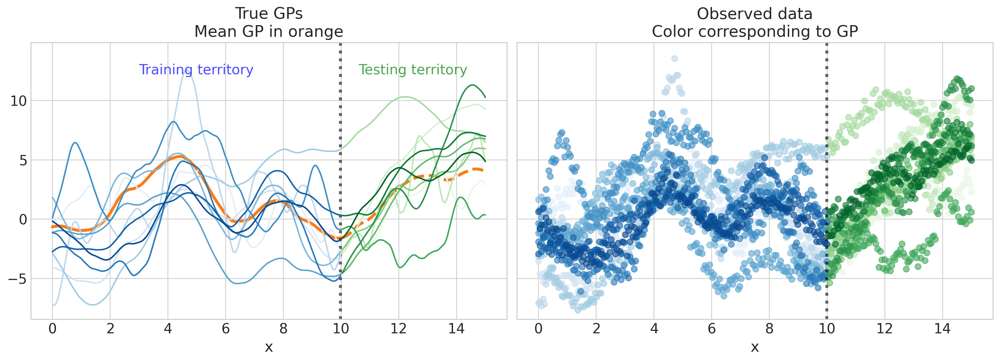

In [6]:
fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
colors_train = plt.cm.Blues(np.linspace(0.1, 0.9, n_gps))
colors_test = plt.cm.Greens(np.linspace(0.1, 0.9, n_gps))
ylims = [1.1 * np.min(y_full), 1.1 * np.max(y_full)]

axs[0].plot(x_train, f_mu_true_train, color="C1", lw=3)
axs[0].plot(x_test, f_mu_true_test, color="C1", lw=3, ls="--")
axs[0].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs[1].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)

# Positioning text for "Training territory" and "Testing territory"
train_text_x = (x_train[0] + x_train[-1]) / 2
test_text_x = (x_train[-1] + x_test[-1]) / 2
text_y = ylims[0] + (ylims[1] - ylims[0]) * 0.9

# Adding text to the left plot
axs[0].text(
    train_text_x,
    text_y,
    "Training territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="blue",
    alpha=0.7,
)
axs[0].text(
    test_text_x,
    text_y,
    "Testing territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="green",
    alpha=0.7,
)

for i in range(n_gps):
    axs[0].plot(x_train, f_true_train[:, i], color=colors_train[i])
    axs[0].plot(x_test, f_true_test[:, i], color=colors_test[i])
    axs[1].scatter(x_train, y_train[:, i], color=colors_train[i], alpha=0.6)
    axs[1].scatter(x_test, y_test[:, i], color=colors_test[i], alpha=0.6)

axs[0].set(xlabel="x", ylim=ylims, title="True GPs\nMean GP in orange")
axs[1].set(xlabel="x", ylim=ylims, title="Observed data\nColor corresponding to GP");

## Build the model

To build this model to allow different lengthscales per GP, we need to rewrite the power spectral density.  The one attached to the PyMC covariance classes, i.e. `pm.gp.cov.Matern52.power_spectral_density`, is vectorized over the _input dimension_, but we need one vectorized across _GPs_.

Fortunately, this one at least isn't too hard to adapt:

### Adapting the power spectral density

In [7]:
def matern52_psd(omega, ls):
    """
    Calculate the power spectral density for the Matern52 covariance kernel.

    Inputs:
      - omega: The frequencies where the power spectral density is evaluated
      - ls: The lengthscales. Can be a scalar or a vector.
    """
    num = 2.0 * np.sqrt(np.pi) * pt.gamma(3.0) * pt.power(5.0, 5.0 / 2.0)
    den = 0.75 * pt.sqrt(np.pi)
    return (num / den) * ls * pt.power(5.0 + pt.outer(pt.square(omega), pt.square(ls)), -3.0)

Next, we build a function that constructs the hierarchical GP.  Notice that it assumes some names for the `dims`, but our goal is to provide a simple foundation that you can adapt to your specific use-case. You can see that this is a bit more deconstructed than `.prior_linearized`.

### Coding the hierarchical GP

One of the added complexities is modeling the additive GPs for the mean GP (long term trend + short term variation). The cool thing is that **HSGP is compatible with additive covariances**, meaning that we don't have to define two completely _independent_ HSGPs.

Instead, we can sum the two independent power spectral densities, and _then_ create a single GP from the combined power spectral densities. This reduces the number of unknown parameters because the two GPs can share the same basis vectors and basis coefficients.

Essentially, this amounts to creating **two independent covariance functions, and just adding them before defining the HSGP object** -- instead of defining two independent HSGP objects. 

If we were able to use the high-level {class}`~pymc.gp.HSGP` class, the code for this would look like:

```python
cov1 = eta1**2 * pm.gp.cov.ExpQuad(input_dim, ls=ell1)
cov2 = eta2**2 * pm.gp.cov.Matern32(input_dim, ls=ell2)
cov = cov1 + cov2

gp = pm.gp.HSGP(m=[m], c=c, cov_func=cov_func)
```

In [8]:
def hierarchical_HSGP(Xs, m, c, eta_mu, ell_mu, eta_delta, ell_delta):
    """
    Constructs a hierarchical Gaussian Process using the HSGP approximation.
    Important: The input features (Xs) should be 0-centered before being passed
    to this function to ensure accurate model behavior.

    Parameters:
    ----------
    Xs : np.ndarray
        The input data for the GPs, which should be zero-centered.
    m : List[int]
        The number of basis vectors to use in the HSGP approximation.
    c : float
        A constant used to set the boundary condition of the HSGP.
    eta_mu : tuple of pm.Distribution
        A tuple containing the amplitude distributions for the mean GP's short-term and long-term components.
    ell_mu : tuple of pm.Distribution
        A tuple containing the length scale distributions for the mean GP's short-term and long-term components.
    eta_delta : pm.Distribution
        The amplitude distribution for the GP offsets. Common to all GPs.
    ell_delta : pm.Distribution
        The length scale distributions for the GP offsets. One per GP.

    Returns:
    -------
    f : pm.Deterministic
        The total GP, combining both the mean GP and hierarchical offsets.
    """
    L = pm.gp.hsgp_approx.set_boundary(Xs, c)
    eigvals = pm.gp.hsgp_approx.calc_eigenvalues(L, m)
    phi = pm.gp.hsgp_approx.calc_eigenvectors(Xs, L, eigvals, m)
    omega = pt.sqrt(eigvals)

    # calculate f_mu, the mean of the hierarchical gp
    basis_coeffs = pm.Normal("f_mu_coeffs", mu=0.0, sigma=1.0, dims="m_ix")

    eta_mu_short, eta_mu_trend = eta_mu
    ell_mu_short, ell_mu_trend = ell_mu

    cov_short = pm.gp.cov.Matern52(input_dim=1, ls=ell_mu_short)
    cov_trend = pm.gp.cov.Matern52(input_dim=1, ls=ell_mu_trend)
    sqrt_psd = eta_mu_short * pt.sqrt(
        cov_short.power_spectral_density(omega).flatten()
    ) + eta_mu_trend * pt.sqrt(cov_trend.power_spectral_density(omega).flatten())
    f_mu = pm.Deterministic("f_mu", phi @ (basis_coeffs * sqrt_psd))

    # calculate f_delta, the gp offsets
    basis_coeffs = pm.Normal("f_delta_coeffs", mu=0.0, sigma=1.0, dims=("m_ix", "gp_ix"))
    sqrt_psd = pt.sqrt(matern52_psd(omega, ell_delta))
    f_delta = phi @ (basis_coeffs * sqrt_psd * eta_delta)

    # calculate total gp
    return pm.Deterministic("f", f_mu[:, None] + f_delta)

### Choosing the HSGP parameters

Next, we use the heuristics to choose `m` and `c`:

In [9]:
m, c = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[np.min(x_full), np.max(x_full)],
    lengthscale_range=[np.min(ell_delta_true), np.max(ell_delta_true)],
    cov_func="matern52",
)
print(f"m: {m}, c: {c:.2f}")

m: 105, c: 3.11


That actually looks a bit too low, especially `c`. We can actually check the computation by hand. The way we defined `hierarchical_HSGP`, it needs the 0-centered `x_train` data, called `Xs`, so we'll need to do that here (we'll also need to do that later when we define the model):

In [10]:
x_center = (np.max(x_train) + np.min(x_train)) / 2
Xs = x_train - x_center

Then we can use the `c` from above and check the implied `L`, which is the result of `set_boundary`:

In [11]:
pm.gp.hsgp_approx.set_boundary(Xs, c)

array(15.53296453)

And this is indeed too low. How do we know? Well, thankfully, `L` has a pretty interpretable meaning in the HSGP decomposition. It is the boundary of the approximation, so we need to chose `L` such that the domain `[-L, L]` contains all points, not only in `x_train`, but in `x_full` (see [the first tutorial](HSGP-Basic.myst.md) for more details).

So we want $L > 15$ in this case, which means we need to increase `c` until we're satisfied:

In [12]:
pm.gp.hsgp_approx.set_boundary(Xs, 4.0)

array(19.96655518)

Bingo!

One last thing we also talked about in the first tutorial: increasing `c` requires increasing `m` to compensate for the loss of fidelity at smaller lengthscales. So let's err on the side of safety and choose:

In [13]:
m, c = 100, 4.0

### Setting up the model

In [14]:
coords = {
    "gp_ix": np.arange(n_gps),
    "m_ix": np.arange(m),
}

As discussed, you'll see we're handling the 0-centering of `X` `before` defining the GP. When you're using `pm.HSGP` or `prior_linearized`, you don't need to care about that, as it's done for you under the hood. But when using more advanced models like this one, you need to get your hands dirtier as you need to access lower-level functions of the package.

In [15]:
with pm.Model(coords=coords) as model:
    ## handle 0-centering correctly
    x_center = (np.max(x_train) + np.min(x_train)) / 2
    X = pm.Data("X", x_train[:, None])
    Xs = X - x_center

    ## Prior for the mean process
    eta_mu_short = pm.Gamma("eta_mu_short", 2, 2)
    log_ell_mu_short = pm.Normal("log_ell_mu_short")
    ell_mu_short = pm.Deterministic("ell_mu_short", pt.softplus(log_ell_mu_short))

    eta_mu_trend = pm.Gamma("eta_mu_trend", mu=3.5, sigma=1)
    ell_mu_trend = pz.maxent(pz.InverseGamma(), lower=5, upper=12, mass=0.95, plot=False).to_pymc(
        "ell_mu_trend"
    )

    ## Prior for the offsets
    log_ell_delta_offset = pm.ZeroSumNormal("log_ell_delta_offset", dims="gp_ix")
    log_ell_delta_sd = pm.Gamma("log_ell_delta_sd", 2, 2)

    log_ell_delta = log_ell_mu_short + log_ell_delta_sd * log_ell_delta_offset
    ell_delta = pm.Deterministic("ell_delta", pt.softplus(log_ell_delta), dims="gp_ix")

    eta_delta = pm.Gamma("eta_delta", 2, 2)

    ## define full GP
    f = hierarchical_HSGP(
        Xs, [m], c, [eta_mu_short, eta_mu_trend], [ell_mu_short, ell_mu_trend], eta_delta, ell_delta
    )

    ## prior on observational noise
    sigma = pm.Exponential("sigma", scale=1)

    ## likelihood
    pm.Normal("y", mu=f, sigma=sigma, observed=y_train, shape=(X.shape[0], n_gps))

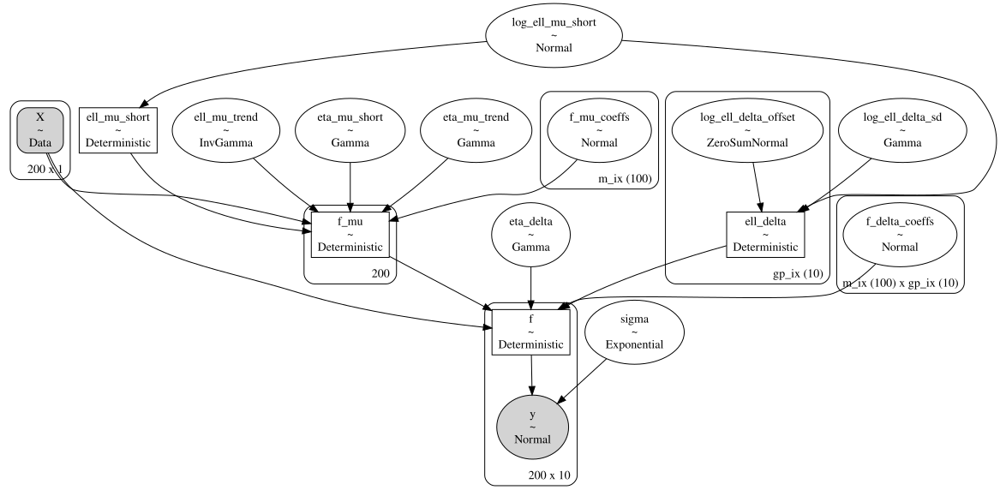

In [16]:
pm.model_to_graphviz(model)

## Prior predictive checks

Now, what do these priors mean? Good question. As always, it's crucial to do **prior predictive checks**, especially for GPs, where amplitudes and lenghtscales can be very hard to infer:

In [17]:
with model:
    idata = pm.sample_prior_predictive(random_seed=rng)

Sampling: [ell_mu_trend, eta_delta, eta_mu_short, eta_mu_trend, f_delta_coeffs, f_mu_coeffs, log_ell_delta_offset, log_ell_delta_sd, log_ell_mu_short, sigma, y]


In [18]:
def plot_gps(idata, f_mu_true, f_true, group="posterior", return_f=False):
    """
    Plot the underlying hierarchical GP and inferred GPs with posterior intervals.

    Parameters:
    - idata: InferenceData object containing the prior or posterior samples.
    - f_mu_true: The true mean function values.
    - f_true: The true function values for each group.
    - group: one of 'prior', 'posterior' or 'predictions'.
            Whether to plot the prior predictive, posterior predictive or out-of-sample predictions samples.
            Default posterior.
    """
    if group == "predictions":
        x = idata.predictions_constant_data.X.squeeze().to_numpy()
    else:
        x = idata.constant_data.X.squeeze().to_numpy()
    y_obs = idata.observed_data["y"].to_numpy()
    n_gps = f_true.shape[1]

    # Extract mean and standard deviation for 'f_mu' and 'f' from the posterior
    f_mu_post = az.extract(idata, group=group, var_names="f_mu")
    f_mu_mu = f_mu_post.mean(dim="sample")
    f_mu_sd = f_mu_post.std(dim="sample")

    f_post = az.extract(idata, group=group, var_names="f")
    f_mu = f_post.mean(dim="sample")
    f_sd = f_post.std(dim="sample")

    # Plot settings
    fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
    colors = plt.cm.Set1(np.linspace(0.1, 0.9, n_gps))
    ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

    # Plot true underlying GP
    axs[0].plot(x, f_mu_true, color="k", lw=3)
    for i in range(n_gps):
        axs[0].plot(x, f_true[:, i], color=colors[i], alpha=0.7)

    # Plot inferred GPs with uncertainty
    for i in range(n_gps):
        axs[1].fill_between(
            x,
            f_mu[:, i] - f_sd[:, i],
            f_mu[:, i] + f_sd[:, i],
            color=colors[i],
            alpha=0.3,
            edgecolor="none",
        )
    # Plot mean GP
    axs[1].fill_between(
        x,
        f_mu_mu - f_mu_sd,
        f_mu_mu + f_mu_sd,
        color="k",
        alpha=0.6,
        edgecolor="none",
    )

    # Set labels and titles
    for ax in axs:
        ax.set_xlabel("x")
        ax.set_ylabel("y")
    axs[0].set(ylim=ylims, title="True GPs for the 10 time-series\nMean GP in black")
    axs[1].set(ylim=ylims, title=r"Inferred GPs, $\pm 1 \sigma$ posterior intervals")

    if return_f:
        return f_mu_mu, f_mu_sd, f_mu, f_sd

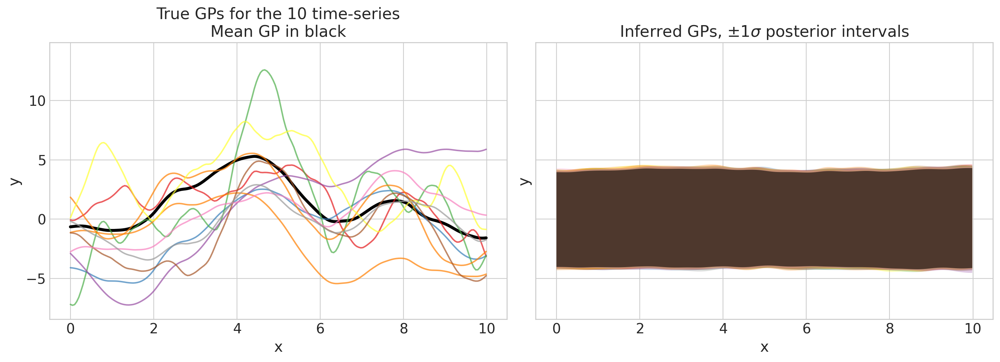

In [19]:
plot_gps(idata, f_mu_true_train, f_true_train, group="prior");

Once we're satisfied with our priors, which is the case here, we can... sample the model!

## Sampling & Convergence checks

In [20]:
with model:
    idata.extend(pm.sample(nuts_sampler="numpyro", target_accept=0.9, random_seed=rng))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/home/osvaldo/anaconda3/envs/pymc/lib/python3.11/site-packages/jax/_src/interpreters/mlir.py:790: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,1000,9]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"
2024-08-17 10:20:29.439310: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 1s:

  %reduce.6 = f64[4,1000,100,10]{3,2,1,0} reduce(f64[4,1000,1,100,10]{4,3,2,1,0} %broadcast.12, f64[] %constant.39), dimensions={2}, to_apply=%region_3.199, metadata={op_name="jit(process_fn)/jit(main)/reduce_prod[axes=(2,)]" source_file="/tmp/tmpzkk5vu9q" source_line=125}

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime. XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input progra

In [21]:
idata.sample_stats.diverging.sum().data

array(2)

In [22]:
var_names = ["eta_mu", "ell_mu", "eta_delta", "ell_delta", "sigma"]
az.summary(idata, var_names=var_names, round_to=2, filter_vars="regex")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ell_delta[0],0.87,0.12,0.66,1.12,0.00,0.00,1709.41,2585.89,1.0
ell_delta[1],2.55,0.58,1.54,3.62,0.01,0.01,1683.63,2477.46,1.0
ell_delta[2],0.52,0.08,0.38,0.66,0.00,0.00,1885.38,2603.51,1.0
ell_delta[3],2.30,0.37,1.65,3.00,0.01,0.01,2346.83,2554.60,1.0
ell_delta[4],1.46,0.18,1.12,1.81,0.00,0.00,2650.76,2751.43,1.0
ell_delta[5],3.12,0.59,2.06,4.18,0.01,0.01,2385.15,2867.07,1.0
ell_delta[6],0.74,0.09,0.58,0.90,0.00,0.00,2075.16,2813.10,1.0
ell_delta[7],1.39,0.17,1.05,1.71,0.00,0.00,2740.15,2762.05,1.0
ell_delta[8],1.92,0.32,1.35,2.52,0.01,0.01,2065.93,2824.22,1.0
ell_delta[9],2.08,0.42,1.37,2.87,0.01,0.01,1532.88,2489.98,1.0


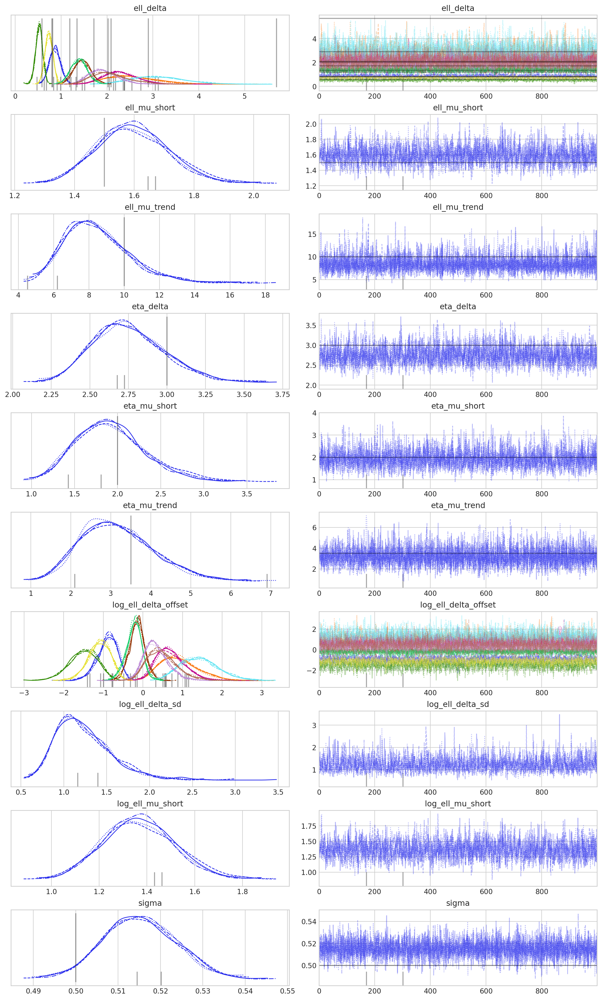

In [23]:
ref_val_lines = [
    ("eta_mu_short", {}, [eta_mu_short_true]),
    ("eta_mu_trend", {}, [eta_mu_trend_true]),
    ("ell_mu_short", {}, [ell_mu_short_true]),
    ("ell_mu_trend", {}, [ell_mu_trend_true]),
    ("eta_delta", {}, [eta_delta_true]),
    ("ell_delta", {}, [ell_delta_true]),
    ("sigma", {}, [sigma_noise]),
]

az.plot_trace(
    idata,
    var_names=["eta_mu", "ell_mu", "eta_delta", "ell_delta", "sigma"],
    lines=ref_val_lines,
    filter_vars="regex",
);

Everything went great here, that's really good sign! Now let's see if the model could recover the true parameters.

## Posterior checks

In [24]:
az.plot_posterior(
    idata,
    var_names=[
        "eta_mu_short",
        "eta_mu_trend",
        "ell_mu_short",
        "ell_mu_trend",
        "eta_delta",
        "ell_delta",
        "sigma",
    ],
    ref_val={
        "eta_mu_short": [{"ref_val": eta_mu_short_true}],
        "eta_mu_trend": [{"ref_val": eta_mu_trend_true}],
        "ell_mu_short": [{"ref_val": ell_mu_short_true}],
        "ell_mu_trend": [{"ref_val": ell_mu_trend_true}],
        "eta_delta": [{"ref_val": eta_delta_true}],
        "ell_delta": [{"gp_ix": i, "ref_val": ell_delta_true[i]} for i in range(n_gps)],
        "sigma": [{"ref_val": sigma_noise}],
    },
    grid=(6, 3),
    textsize=30,
);

Really good job -- the model recovered everything decently!

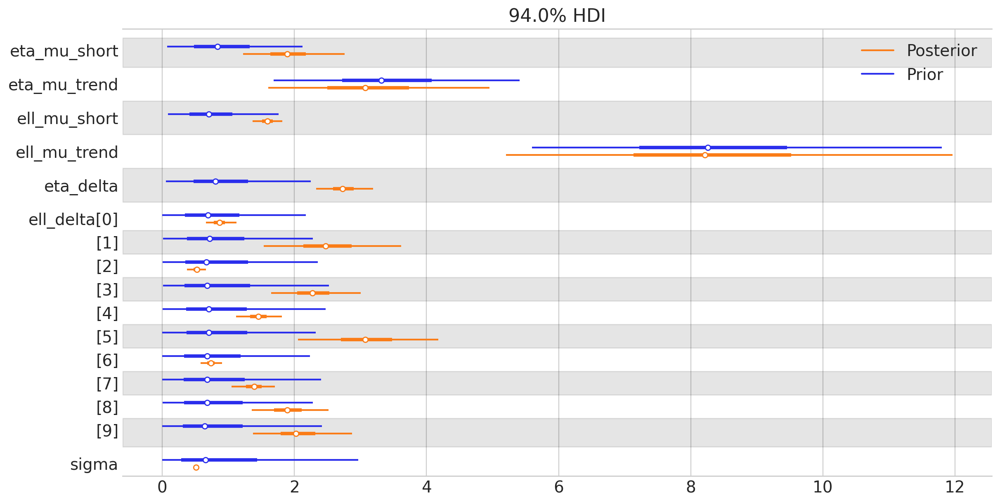

In [25]:
az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names=[
        "eta_mu_short",
        "eta_mu_trend",
        "ell_mu_short",
        "ell_mu_trend",
        "eta_delta",
        "ell_delta",
        "sigma",
    ],
    combined=True,
    figsize=(12, 6),
);

And we can see the GP parameters were well informed by the data. Let's close up this section by updating our prior predictive plot with the posterior of the inferred GPs:

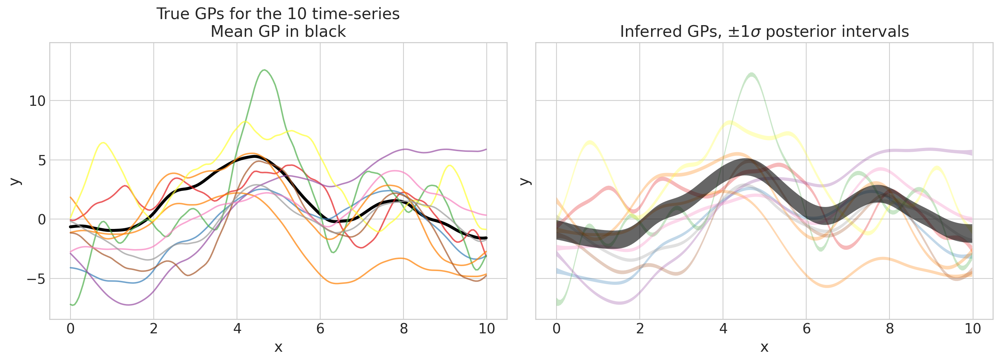

In [26]:
plot_gps(idata, f_mu_true_train, f_true_train);

That looks great! Now we can go ahead and predict out of sample.

## Out-of-sample predictions

In [27]:
with model:
    pm.set_data({"X": x_full[:, None]})

    idata.extend(
        pm.sample_posterior_predictive(
            idata,
            var_names=["f_mu", "f"],
            predictions=True,
            compile_kwargs={"mode": "NUMBA"},
            random_seed=rng,
        ),
    )

Sampling: []


Output()

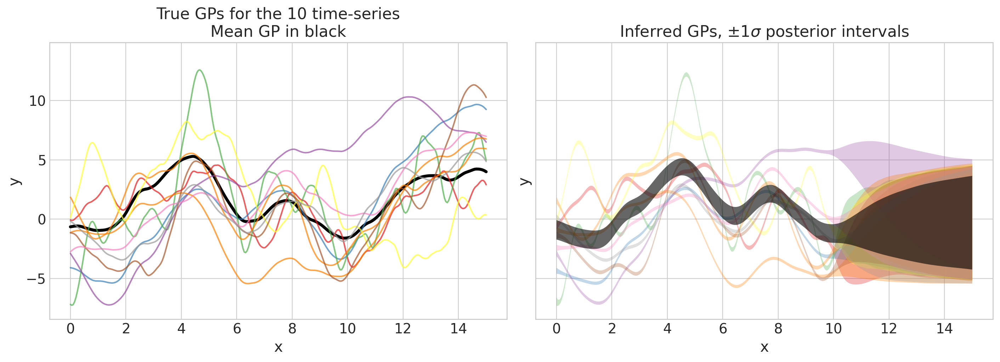

In [28]:
pred_f_mu_mu, pred_f_mu_sd, pred_f_mu, pred_f_sd = plot_gps(
    idata, f_mu_true_full, f_true_full, group="predictions", return_f=True
)

This looks good! And we can check our predictions make sense with another plot:

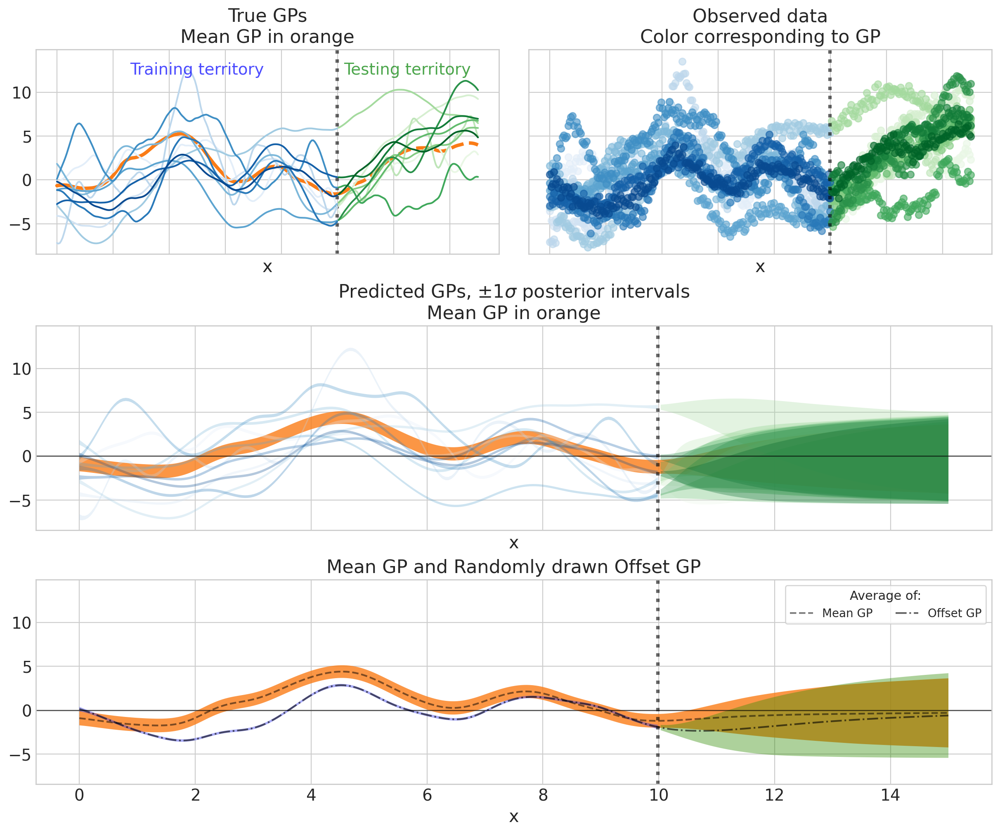

In [29]:
fig, axs = plt.subplot_mosaic(
    [["True", "Data"], ["Preds", "Preds"], ["Subset", "Subset"]],
    layout="constrained",
    sharex=True,
    sharey=True,
    figsize=(12, 10),
)

axs["True"].plot(x_train, f_mu_true_train, color="C1", lw=3)
axs["True"].plot(x_test, f_mu_true_test, color="C1", lw=3, ls="--")
axs["True"].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs["True"].text(
    train_text_x,
    text_y,
    "Training territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="blue",
    alpha=0.7,
)
axs["True"].text(
    test_text_x,
    text_y,
    "Testing territory",
    horizontalalignment="center",
    verticalalignment="center",
    fontsize=14,
    color="green",
    alpha=0.7,
)
axs["Data"].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs["Preds"].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs["Subset"].axvline(x_train[-1], ls=":", lw=3, color="k", alpha=0.6)
axs["Preds"].axhline(lw=1, color="k", alpha=0.6)
axs["Subset"].axhline(lw=1, color="k", alpha=0.6)

# Plot mean GP
axs["Preds"].fill_between(
    x_full,
    pred_f_mu_mu - pred_f_mu_sd,
    pred_f_mu_mu + pred_f_mu_sd,
    color="C1",
    alpha=0.8,
    edgecolor="none",
)
axs["Subset"].fill_between(
    x_full,
    pred_f_mu_mu - pred_f_mu_sd,
    pred_f_mu_mu + pred_f_mu_sd,
    color="C1",
    alpha=0.8,
    edgecolor="none",
)
axs["Subset"].plot(
    x_full,
    pred_f_mu_mu,
    color="k",
    alpha=0.5,
    ls="--",
    label="Mean GP",
)

for i in range(n_gps):
    axs["True"].plot(x_train, f_true_train[:, i], color=colors_train[i])
    axs["True"].plot(x_test, f_true_test[:, i], color=colors_test[i])
    axs["Data"].scatter(x_train, y_train[:, i], color=colors_train[i], alpha=0.6)
    axs["Data"].scatter(x_test, y_test[:, i], color=colors_test[i], alpha=0.6)

    # Plot inferred GPs with uncertainty
    axs["Preds"].fill_between(
        x_train,
        pred_f_mu[:n_train, i] - pred_f_sd[:n_train, i],
        pred_f_mu[:n_train, i] + pred_f_sd[:n_train, i],
        color=colors_train[i],
        alpha=0.3,
        edgecolor="none",
    )
    axs["Preds"].fill_between(
        x_test,
        pred_f_mu[n_train:, i] - pred_f_sd[n_train:, i],
        pred_f_mu[n_train:, i] + pred_f_sd[n_train:, i],
        color=colors_test[i],
        alpha=0.3,
        edgecolor="none",
    )

i = rng.choice(n_gps)
axs["Subset"].fill_between(
    x_train,
    pred_f_mu[:n_train, i] - pred_f_sd[:n_train, i],
    pred_f_mu[:n_train, i] + pred_f_sd[:n_train, i],
    color="C0",
    alpha=0.4,
    edgecolor="none",
)
axs["Subset"].fill_between(
    x_test,
    pred_f_mu[n_train:, i] - pred_f_sd[n_train:, i],
    pred_f_mu[n_train:, i] + pred_f_sd[n_train:, i],
    color="C2",
    alpha=0.4,
    edgecolor="none",
)
axs["Subset"].plot(
    x_full,
    pred_f_mu[:, i],
    color="k",
    alpha=0.6,
    ls="-.",
    label="Offset GP",
)

axs["True"].set(xlabel="x", ylim=ylims, title="True GPs\nMean GP in orange")
axs["Data"].set(xlabel="x", ylim=ylims, title="Observed data\nColor corresponding to GP")
axs["Preds"].set(
    xlabel="x",
    ylim=ylims,
    title="Predicted GPs, $\\pm 1 \\sigma$ posterior intervals\nMean GP in orange",
)
axs["Subset"].set(
    xlabel="x",
    ylim=ylims,
    title="Mean GP and Randomly drawn Offset GP",
)
axs["Subset"].legend(title="Average of:", frameon=True, ncols=2, fontsize=10, title_fontsize=11);

Phew, that's a lot of information! Let's see what we can make of this:

- As data become sparse, the **long-term trend is reverting back to the overall GP mean** (i.e 0), but hasn't reached it yet, because the length scale on the trend is bigger than the testing period of 5 (`ell_mu_trend_true = 10`).
- The **short-term variation on the mean GP isn't obvious** because it's small relative to the trend. But it _is_ noticeable: it creates the small wiggles in the orange HDI, and makes this HDI wider in comparison to the individual GPs (the blue ones).
- The **individual GPs revert faster to the mean GP** (orange envelope) **than to the GP mean** (i.e 0), which is the behavior we want from the hierarchical structure.

# Example 2: An HSGP that exploits Kronecker structure

This example is a multiple GP model like the previous one, but it assumes a different relationship between the GPs. **Instead of pooling towards a common mean GP, there is an additional covariance structure that specifies their relationship**.

For example, we may have time series measurements of temperature from multiple weather stations. The similarity over time should mostly depend only on the _distance_ between the weather stations. They all will likely have the same dynamics, or same covariance structure, over time. You can think of this as _local_ partial pooling.  

In the example below, we arrange the GPs along a single "spatial" axis, so it's a 1D problem and not 2D, and then allow them to share the same time covariance.  This might be clearer after taking a look at the simulated data below.  

Mathematically, this model uses the {ref}`Kronecker product <GP-Kron>`, where the "space" and "time" dimensions are _separable_.
$$
K = K_{x} \otimes K_{t}
$$
If there are $n_t$ time points and $n_x$ GPs, then the resulting $K$ matrix will have dimension $n_x \cdot n_t \times n_x \cdot n_t$.  Using a regular GP, this would be $\mathcal{O}(n_t^3 n_x^3)$.  So, we can achieve a pretty massive speed-up by both taking advantage of Kronecker structure and using the HSGP approximation.  It isn't required that both of the dimensions (in this example, space and time) use the HSGP approximation.  It's possible to use either a vanilla GP or inducing points for the "spatial" covariance, and the HSGP approximation in time.  In the example below, both use the HSGP approximation.

**Refer to this section if you're interested in:**
1. Seeing an example of exploiting Kronecker structure and the HSGP approximation.
2. Seeing how to construct more advanced and custom GP models.

## Data generation

In [30]:
n_gps, n_t = 30, 100
t = np.linspace(0, 10, n_t)
x = np.linspace(-5, 5, n_gps)

eta_true = 1.0
ell_x_true = 2.0
cov_x = eta_true**2 * pm.gp.cov.Matern52(input_dim=1, ls=ell_x_true)
Kx = cov_x(x[:, None])

ell_t_true = 2.0
cov_t = pm.gp.cov.Matern52(input_dim=1, ls=ell_t_true)
Kt = cov_t(t[:, None])

K = pt.slinalg.kron(Kx, Kt)
f_true = (
    pm.draw(pm.MvNormal.dist(mu=np.zeros(n_gps * n_t), cov=K), random_seed=rng)
    .reshape(n_gps, n_t)
    .T
)

# Additive gaussian noise
sigma_noise = 0.5
noise_dist = pm.Normal.dist(mu=0.0, sigma=sigma_noise)

y_obs = f_true + pm.draw(noise_dist, draws=n_t * n_gps, random_seed=rng).reshape(n_t, n_gps)

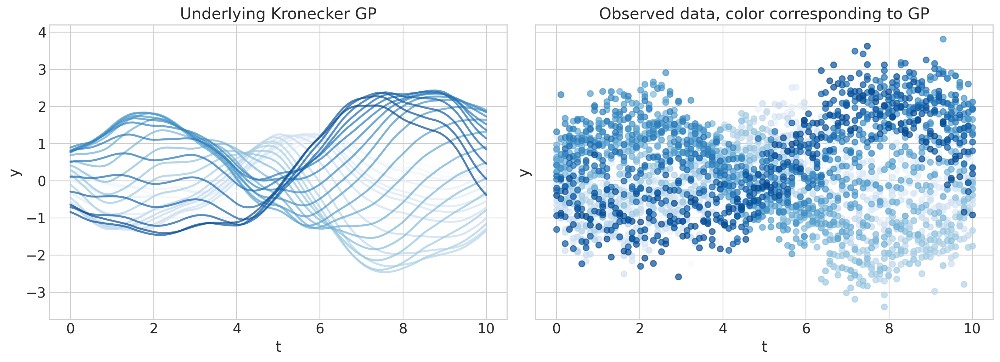

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
colors = plt.cm.Blues(np.linspace(0.0, 0.9, n_gps))
ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

for i in range(n_gps):
    axs[0].plot(t, f_true[:, i], color=colors[i], lw=2, alpha=0.7)
    axs[1].scatter(t, y_obs[:, i], color=colors[i], alpha=0.7)

for ax in axs:
    ax.set_xlabel("t")
    ax.set_ylabel("y")
axs[0].set(ylim=ylims, title="Underlying Kronecker GP")
axs[1].set(ylim=ylims, title="Observed data, color corresponding to GP");

## Kronecker GP specification

In [32]:
def kronecker_HSGP(Xs, m, c, cov_t, cov_x):
    Xs_t, Xs_x = Xs  # Xs needs to be 0-centered
    m_t, m_x = m
    c_t, c_x = c

    L_t = pm.gp.hsgp_approx.set_boundary(Xs_t, c_t)
    eigvals_t = pm.gp.hsgp_approx.calc_eigenvalues(L_t, [m_t])
    phi_t = pm.gp.hsgp_approx.calc_eigenvectors(Xs_t, L_t, eigvals_t, [m_t])
    omega_t = pt.sqrt(eigvals_t)

    sqrt_psd_t = pt.sqrt(cov_t.power_spectral_density(omega_t))
    chol_t = phi_t * sqrt_psd_t

    L_x = pm.gp.hsgp_approx.set_boundary(Xs_x, c_x)
    eigvals_x = pm.gp.hsgp_approx.calc_eigenvalues(L_x, [m_x])
    phi_x = pm.gp.hsgp_approx.calc_eigenvectors(Xs_x, L_x, eigvals_x, [m_x])
    omega_x = pt.sqrt(eigvals_x)

    sqrt_psd_x = pt.sqrt(cov_x.power_spectral_density(omega_x))
    chol_x = phi_x * sqrt_psd_x

    z = pm.Normal("beta", size=m_x * m_t)

    return (chol_x @ (chol_t @ pt.reshape(z, (m_t, m_x))).T).T

## PyMC Model

Next, we use the heuristics to choose `m` and `c`:

In [33]:
m_t, c_t = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[np.min(t), np.max(t)], lengthscale_range=[1.0, 3.0], cov_func="matern52"
)
m_x, c_x = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[np.min(x), np.max(x)], lengthscale_range=[1.0, 3.0], cov_func="matern52"
)

print(f"m_t: {m_t}, c_t: {c_t:.2f}")
print(f"m_x: {m_x}, c_x: {c_x:.2f}")

m_t: 32, c_t: 2.46
m_x: 32, c_x: 2.46


In [34]:
with pm.Model() as model:
    ## handle 0-centering correctly
    xt_center = (np.max(t) + np.min(t)) / 2
    Xt = pm.Data("Xt", t[:, None])
    Xs_t = Xt - xt_center

    xx_center = (np.max(x) + np.min(x)) / 2
    Xx = pm.Data("Xx", x[:, None])
    Xs_x = Xx - xx_center

    ## covariance on time GP
    ell_t = pz.maxent(pz.LogNormal(), lower=0.5, upper=4.0, mass=0.95, plot=False).to_pymc("ell_t")
    cov_t = pm.gp.cov.Matern52(1, ls=ell_t)

    ## covariance on space GP
    ell_x = pz.maxent(pz.LogNormal(), lower=0.5, upper=4.0, mass=0.95, plot=False).to_pymc("ell_x")
    cov_x = pm.gp.cov.Matern52(1, ls=ell_x)

    ## Kronecker GP
    eta = pm.Gamma("eta", 2, 2)
    Xs, m, c = [Xs_t, Xs_x], [m_t, m_x], [c_t, c_x]
    f = kronecker_HSGP(Xs, m, c, cov_t, cov_x)
    f = pm.Deterministic("f", eta * f)

    # observational noise
    sigma = pm.Exponential("sigma", scale=1)

    # likelihood
    pm.Normal("y", mu=f, sigma=sigma, observed=y_obs)

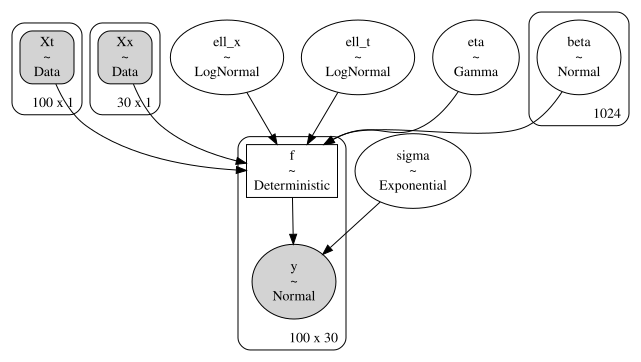

In [35]:
pm.model_to_graphviz(model)

## Prior predictive checks

In [36]:
with model:
    idata = pm.sample_prior_predictive(random_seed=rng)

Sampling: [beta, ell_t, ell_x, eta, sigma, y]


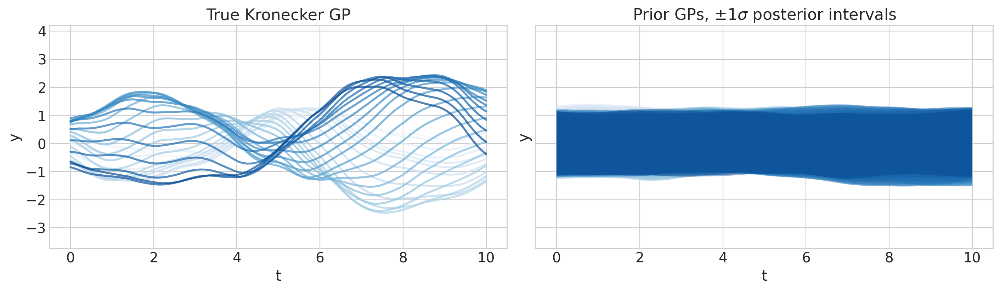

In [37]:
f_mu = az.extract(idata, group="prior", var_names="f").mean(dim="sample")
f_sd = az.extract(idata, group="prior", var_names="f").std(dim="sample")

fig, axs = plt.subplots(1, 2, figsize=(14, 4), sharex=True, sharey=True)
colors = plt.cm.Blues(np.linspace(0.0, 0.9, n_gps))
ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

for i in range(n_gps):
    axs[0].plot(t, f_true[:, i], color=colors[i], lw=2, alpha=0.7)
    axs[1].fill_between(
        t,
        f_mu[:, i] - f_sd[:, i],
        f_mu[:, i] + f_sd[:, i],
        color=colors[i],
        alpha=0.4,
        edgecolor="none",
    )

for ax in axs:
    ax.set_xlabel("t")
    ax.set_ylabel("y")

axs[0].set(ylim=ylims, title="True Kronecker GP")
axs[1].set(ylim=ylims, title=r"Prior GPs, $\pm 1 \sigma$ posterior intervals");

## Sampling & Convergence checks

In [38]:
with model:
    idata.extend(pm.sample(nuts_sampler="numpyro", random_seed=rng))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

2024-08-17 10:22:58.363258: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 2s:

  %reduce.3 = f64[4,1000,100,32]{3,2,1,0} reduce(f64[4,1000,1,100,32]{4,3,2,1,0} %broadcast.7, f64[] %constant.24), dimensions={2}, to_apply=%region_3.90, metadata={op_name="jit(process_fn)/jit(main)/reduce_prod[axes=(2,)]" source_file="/tmp/tmp2qa9axab" source_line=55}

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime. XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2024-08-17 10:23:10.111194: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 13.753874175s
Constant folding an instruction is taking > 2s:

  %reduce.3 = f64[4,1000,100,3

In [39]:
idata.sample_stats.diverging.sum().data

array(0)

In [40]:
az.summary(idata, var_names=["eta", "ell_x", "ell_t", "sigma"], round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
eta,1.21,0.19,0.88,1.58,0.00,0.0,1549.16,2142.20,1.0
ell_x,2.21,0.22,1.82,2.62,0.01,0.0,1668.86,2593.89,1.0
ell_t,2.34,0.24,1.89,2.81,0.01,0.0,1606.45,2366.53,1.0
sigma,0.50,0.01,0.49,0.52,0.00,0.0,6315.09,2993.34,1.0


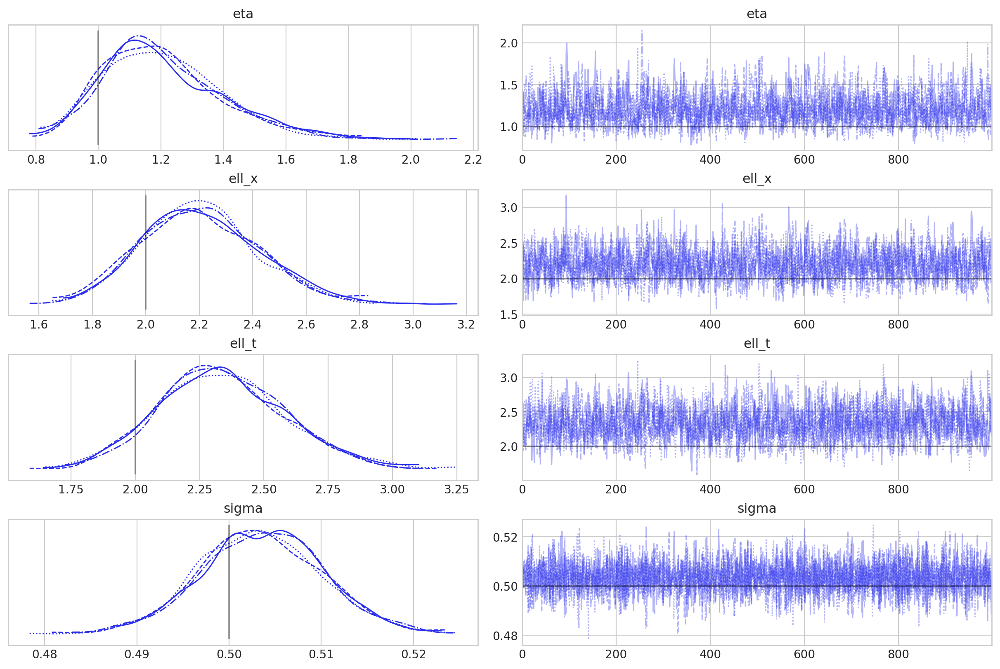

In [41]:
az.plot_trace(
    idata,
    var_names=["eta", "ell_x", "ell_t", "sigma"],
    lines=[
        ("eta", {}, [eta_true]),
        ("ell_x", {}, [ell_x_true]),
        ("ell_t", {}, [ell_t_true]),
        ("sigma", {}, [sigma_noise]),
    ],
);

## Posterior predictive checks

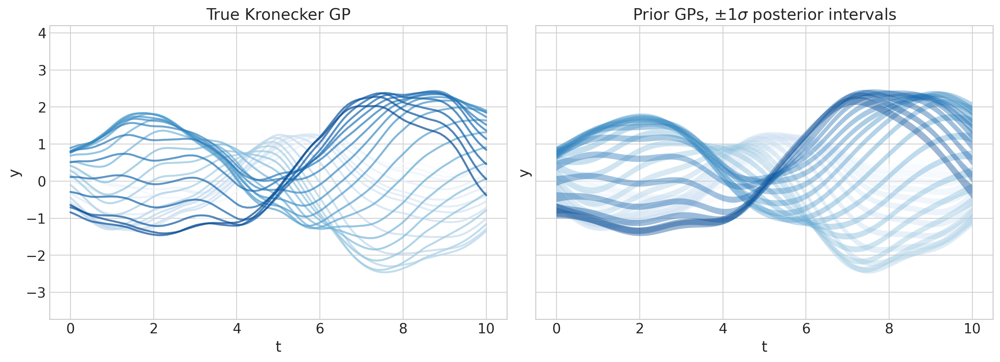

In [42]:
f_mu = az.extract(idata, group="posterior", var_names="f").mean(dim="sample")
f_sd = az.extract(idata, group="posterior", var_names="f").std(dim="sample")

fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)
colors = plt.cm.Blues(np.linspace(0.0, 0.9, n_gps))
ylims = [1.1 * np.min(y_obs), 1.1 * np.max(y_obs)]

for i in range(n_gps):
    axs[0].plot(t, f_true[:, i], color=colors[i], lw=2, alpha=0.7)
    axs[1].fill_between(
        t,
        f_mu[:, i] - f_sd[:, i],
        f_mu[:, i] + f_sd[:, i],
        color=colors[i],
        alpha=0.4,
        edgecolor="none",
    )

for ax in axs:
    ax.set_xlabel("t")
    ax.set_ylabel("y")

axs[0].set(ylim=ylims, title="True Kronecker GP")
axs[1].set(ylim=ylims, title=r"Prior GPs, $\pm 1 \sigma$ posterior intervals");

And isn't this beautiful?? Now go on, and HSGP-on!

## Authors

* Created by [Bill Engels](https://github.com/bwengals), [Alexandre Andorra](https://github.com/AlexAndorra) and [Maxim Kochurov](https://github.com/ferrine) in 2024 ([pymc-examples#668](https://github.com/pymc-devs/pymc-examples/pull/668))
* Use `pz.maxent` instead of `pm.find_constrained_prior`, and add random seed. [Osvaldo Martin](https://aloctavodia.github.io/). August 2024

## Watermark

In [43]:
%load_ext watermark
%watermark -n -u -v -iv -w -p xarray

Last updated: Sat Aug 17 2024

Python implementation: CPython
Python version       : 3.11.5
IPython version      : 8.16.1

xarray: 2023.10.1

arviz     : 0.19.0.dev0
preliz    : 0.9.0
pymc      : 5.16.2+20.g747fda319
numpy     : 1.24.4
pytensor  : 2.25.2
matplotlib: 3.8.4

Watermark: 2.4.3



:::{include} ../page_footer.md
:::